# Introduction

This plotly notebook tutorial is based on this video : https://www.youtube.com/watch?v=GGL6U0k8WYA&ab_channel=DerekBanas

It provides complete coverage of Plotly with many real world examples. Plotly allows us to make beautiful static as wall as animated charts.

This tutorial gets straight to the point, presenting all the types of graphics you can make with Plotly, along with a number of useful tips and commands.

# Imports

In [34]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

# Basics

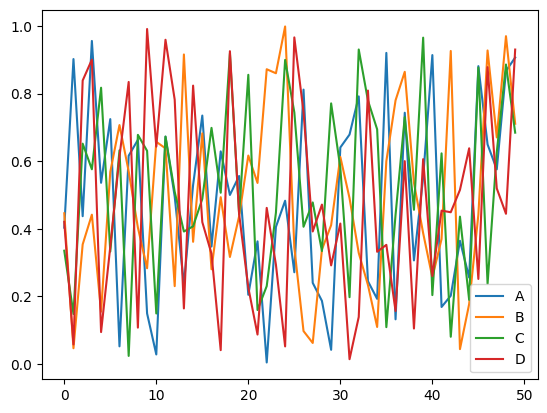

In [35]:
arr_1 = np.random.rand(50, 4)
df_1 = pd.DataFrame(arr_1, columns=['A','B','C','D'])
df_1.head()

# old way to plot
df_1.plot()

df_1.iplot()

# Line Plots

In [36]:
import plotly.graph_objects as go
df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y':'Price'})

px.line(df_stocks, x='date', y=['GOOG','AAPL'],
        labels={'x':'Date', 'y':'Price'}, title='Apple vs. Google')

In [37]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL,
                         mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN,
                         mode='lines+markers', name='Amazon'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG,
                         mode='lines+markers', name='Google',
                         line=dict(color='firebrick', width=2,
                                   dash='dashdot')))

In [38]:
# fig.update_layout(title='Stock Price Data 2018 - 2020',
#                   xaxis_title='Date', yaxis_title='Price')

fig.update_layout(
    xaxis=dict(
        showline=True, showgrid=False, showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2, ticks='outside', tickfont=dict(
            family='Arial', size=12, color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(showgrid=False, zeroline=False, showline=False,
               showticklabels=False),
    autosize=False,
    margin=dict(autoexpand=False, l=100, r=20, t=110, ),
    showlegend=False, plot_bgcolor='white'
)

# Bar Charts

In [39]:
df_us = px.data.gapminder().query("country == 'France'")
px.bar(df_us, x='year', y='pop')

In [40]:
df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex',
       title='Tips by Sex on Each Day',
       labels={'tip': 'Tip Amount', 'day': 'Day of the Weeek'})

In [41]:
px.bar(df_tips, x='sex', y='total_bill', color='smoker',
       barmode='group')

In [42]:
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=-45)

fig

# Scatter Plots

In [43]:
df_iris = px.data.iris()
px.scatter(df_iris, x='sepal_width', y='sepal_length',
           color='species', size='petal_length',
           hover_data=['petal_width'])

In [44]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width, y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species, marker=dict(showscale=True))
)

fig.update_traces(marker_line_width=2, marker_size=10)

In [45]:
fig = go.Figure(data=go.Scattergl(
    x=np.random.randn(100000),
    y=np.random.randn(100000),
    mode='markers',
    marker=dict(color=np.random.randn(100000),
                colorscale='Viridis',
                line_width=1)))

fig

# Pie Charts

colors : plotly.com/python/builtin-colorscales/

In [46]:
df_asia = px.data.gapminder().query("year == 2007").query("continent == 'Asia'")
px.pie(df_asia, values='pop', names='country',
       title='Population of Asian Continent in 2007',
       color_discrete_sequence=px.colors.sequential.RdBu)

In [47]:
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water', 'Grass', 'Normal','Psychic', 'Fire', 'Ground'],
                             values=[110, 90, 80, 80, 70, 60])])
fig

In [48]:
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  textinfo='label+percent',
                  pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='#FFFFFF',
                                                       width=2)))
fig

# Histogram

In [50]:
dice_1 = np.random.randint(1,7,5000)
dice_2 = np.random.randint(1,7,5000)
dice_sum = dice_1 + dice_2
fig = px.histogram(dice_sum, nbins=11,
                   labels={'value': 'Dice Roll'},
                   title='5000 Dice Roll Histogram',
                   marginal='violin',
                   color_discrete_sequence=['green'])
fig

In [51]:
fig.update_layout(xaxis_title_text='Dice Roll',
                  yaxis_title_text='Dice Sum',
                  bargap=0.2, showlegend=False)
fig

In [52]:
df_tips = px.data.tips()
px.histogram(df_tips, x='total_bill', color='sex')

# Box Plots

# Violin Plots

# Density Heatmap

# 3D Scatter Plots

# 3D Line Plots

# Scatter Matrix

# Map Scatter Plot

# Choropleth Maps

# Polar Chart

# Ternary Plot

# Facets

# Animated Plots